### Columns Description:
### --------------------------------------------------------------------------------------------------------
#### · Store - the store number
#### · Date - the week of sales
#### · Weekly_Sales - sales for the given store
#### · Holiday_Flag - whether the week is a special holiday week 1 – Holiday week 0 – Non-holiday week
#### · Temperature - Temperature on the day of sale
#### · Fuel_Price - Cost of fuel in the region
#### · CPI – Prevailing consumer price index
#### · Unemployment - Prevailing unemployment rate
### --------------------------------------------------------------------------------------------------------
#### · Holiday Events: 

####   - Super Bowl: 12-Feb-10, 11-Feb-11, 10-Feb-12, 8-Feb-13\
####   - Labour Day: 10-Sep-10, 9-Sep-11, 7-Sep-12, 6-Sep-13\
####   - Thanksgiving: 26-Nov-10, 25-Nov-11, 23-Nov-12, 29-Nov-13\
####   - Christmas: 31-Dec-10, 30-Dec-11, 28-Dec-12, 27-Dec-13

In [147]:
#Let's import libraries
import calendar
import sklearn
import warnings
import numpy as np
import pandas as pd
from scipy.stats import skew
import seaborn as sns
from scipy.stats import kurtosis
import plotly.express as px
import matplotlib.pylab as plt
import matplotlib.pyplot as plt
from sklearn import metrics
from matplotlib.pylab import rcParams
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator,ClassifierMixin
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.preprocessing import PolynomialFeatures,scale , LabelEncoder,OneHotEncoder
from sklearn.linear_model import LinearRegression
import xgboost as xgb
from sklearn.linear_model import Ridge
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score,classification_report,roc_auc_score,roc_curve,auc
warnings.filterwarnings('ignore')
%matplotlib inline

In [177]:
#Let's load data frame
df=pd.read_csv('walmart.csv')
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [178]:
#Let's look at null values
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [179]:
#Let's find number of unique values 
df.nunique()

Store             45
Date             143
Weekly_Sales    6435
Holiday_Flag       2
Temperature     3528
Fuel_Price       892
CPI             2145
Unemployment     349
dtype: int64

In [180]:
#Let's find info of dataframe
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [181]:
#Let's examine describe of data frame
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Store,6435.0,2.300000e+01,12.988182,1.000,12.000,23.000000,3.400000e+01,4.500000e+01
Weekly_Sales,6435.0,1.046965e+06,564366.622054,209986.250,553350.105,960746.040000,1.420159e+06,3.818686e+06
Holiday_Flag,6435.0,6.993007e-02,0.255049,0.000,0.000,0.000000,0.000000e+00,1.000000e+00
Temperature,6435.0,6.066378e+01,18.444933,-2.060,47.460,62.670000,7.494000e+01,1.001400e+02
Fuel_Price,6435.0,3.358607e+00,0.459020,2.472,2.933,3.445000,3.735000e+00,4.468000e+00
CPI,6435.0,1.715784e+02,39.356712,126.064,131.735,182.616521,2.127433e+02,2.272328e+02
Unemployment,6435.0,7.999151e+00,1.875885,3.879,6.891,7.874000,8.622000e+00,1.431300e+01


In [204]:
#Data frame shape
rows , cols = df.shape
print('·Number of columns: {} \n·Number of rows: {}'.format(cols,rows))

·Number of columns: 10 
·Number of rows: 6435


In [205]:
print('Number of row:',len(df))
print('Number of row:',df.index[-1]+1)

Number of row: 6435
Number of row: 6435


In [182]:
#Data types of columns
df.dtypes

Store             int64
Date             object
Weekly_Sales    float64
Holiday_Flag      int64
Temperature     float64
Fuel_Price      float64
CPI             float64
Unemployment    float64
dtype: object

In [183]:
#Let's look at min/max value of columns:
for i in df.columns:
    a = list(df[i].sort_values())
    print(f'{i} column:')
    print(f'·Min value: {a[0]} \n·Max value: {a[-1]}')
    print('=========================================================')

Store column:
·Min value: 1 
·Max value: 45
Date column:
·Min value: 01-04-2011 
·Max value: 31-12-2010
Weekly_Sales column:
·Min value: 209986.25 
·Max value: 3818686.45
Holiday_Flag column:
·Min value: 0 
·Max value: 1
Temperature column:
·Min value: -2.06 
·Max value: 100.14
Fuel_Price column:
·Min value: 2.472 
·Max value: 4.468
CPI column:
·Min value: 126.064 
·Max value: 227.2328068
Unemployment column:
·Min value: 3.879 
·Max value: 14.313


In [184]:
df['Date'] = pd.to_datetime(df['Date'], format="%d-%m-%Y").dt.date

In [185]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667


### Checking Holiday flag column

In [186]:
#Let's look at value counts of Holiday Flag
df['Holiday_Flag'].value_counts()

Holiday_Flag
0    5985
1     450
Name: count, dtype: int64

In [187]:
a = ['12-Feb-10', '11-Feb-11', '10-Feb-12', '8-Feb-13',
     '10-Sep-10', '9-Sep-11', '7-Sep-12', '6-Sep-13',
     '26-Nov-10', '25-Nov-11', '23-Nov-12', '29-Nov-13',
     '31-Dec-10', '30-Dec-11', '28-Dec-12', '27-Dec-13']

b = [pd.to_datetime(i).date() for i in a]

In [188]:
#Let's convert value with nan
df.at[1, 'Holiday_Flag'] = np.nan

In [189]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0.0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,NaN,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0.0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0.0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0.0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0.0,64.88,3.997,192.013558,8.684
6431,45,2012-10-05,733455.07,0.0,64.89,3.985,192.170412,8.667
6432,45,2012-10-12,734464.36,0.0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0.0,56.47,3.969,192.330854,8.667


In [190]:
# Fill missing 'Holiday_Flag' values based on 'Date' column
df['Holiday_Flag'] = df.apply(lambda row: 1 if row['Date'] in b else 0, axis=1)

In [191]:
#Data Frame
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667


In [192]:
df['Holiday_Flag'].value_counts()

Holiday_Flag
0    5985
1     450
Name: count, dtype: int64

### Result: Column is correct !!! 

### Filling Null values

In [193]:
#If temperature has null values, we can convert with monthly average temperature:
df['Date'] = pd.to_datetime(df['Date'])
df['monthly_temp'] = df.groupby(['Store', df['Date'].dt.month])['Temperature'].transform('mean')
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,monthly_temp
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,47.786667
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,47.786667
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,47.786667
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,47.786667
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,59.553077
...,...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684,69.526154
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667,58.910000
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667,58.910000
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667,58.910000


In [194]:
#If Fuel price has null values, we can convert with:
df['monthly_fuelprice'] = df.groupby(['Store', df['Date'].dt.month])['Fuel_Price'].transform('mean')
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,monthly_temp,monthly_fuelprice
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,47.786667,3.012500
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,47.786667,3.012500
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,47.786667,3.012500
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,47.786667,3.012500
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,59.553077,3.316692
...,...,...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684,69.526154,3.482000
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667,58.910000,3.405846
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667,58.910000,3.405846
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667,58.910000,3.405846


In [195]:
#Let's replace null values
df['Fuel_Price'].fillna(df['monthly_fuelprice'], inplace=True)

### Visualization

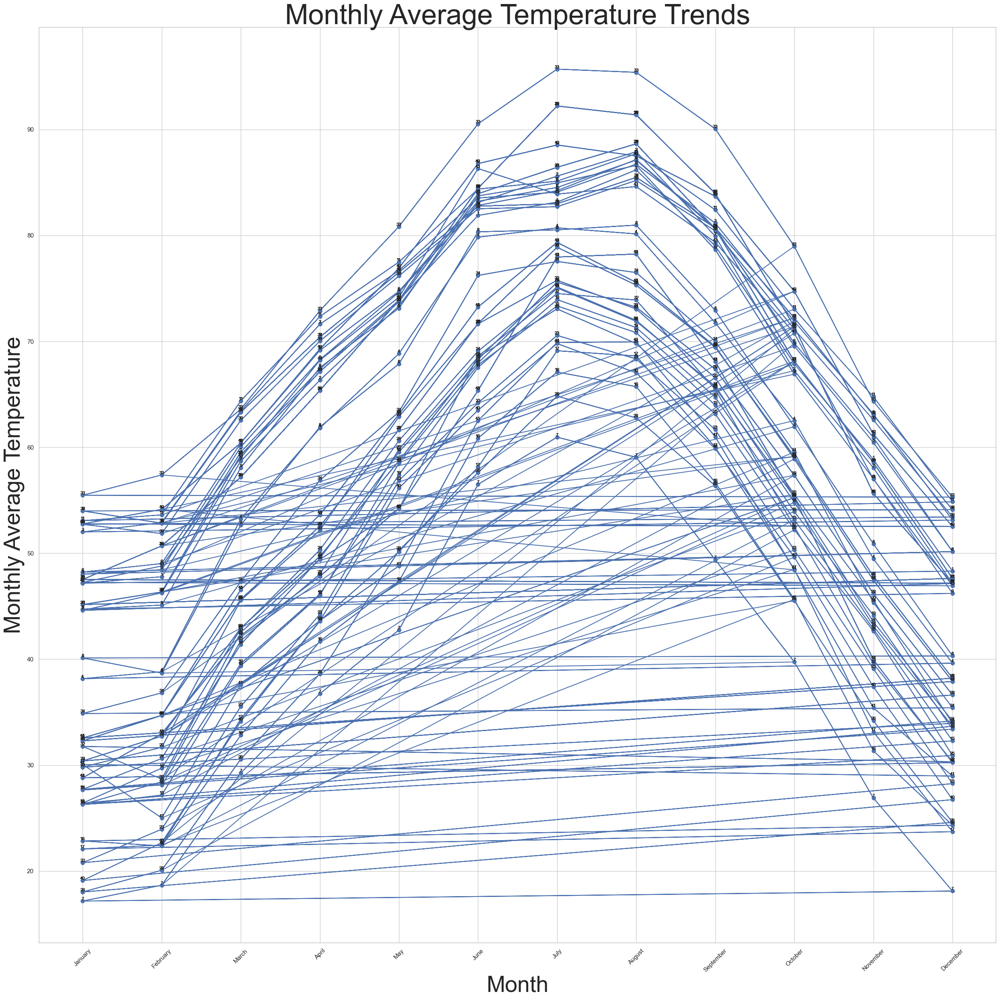

In [199]:
#Let's see which month has more sales
df['Date'] = pd.to_datetime(df['Date'])
# Plot the monthly average temperature against the months
plt.figure(figsize=(25, 25))
plt.plot(df['Date'].dt.month, df['monthly_temp'], marker='o', linestyle='-', color='b')
# Set labels and title
plt.xlabel('Month', fontsize = 40)
plt.ylabel('Monthly Average Temperature' , fontsize = 40)
plt.title('Monthly Average Temperature Trends' , fontsize = 50)
# Customize x-axis ticks to show month names
plt.xticks(range(1, 13), calendar.month_name[1:], rotation=45)
# Show gridlines
plt.grid(True)
# Add data labels for the 'Store' column
for i, store in enumerate(df['Store']):
    plt.text(df['Date'].dt.month.iloc[i], df['monthly_temp'].iloc[i], str(store),
             fontsize=8, ha='center', va='bottom')
# Show the plot
plt.tight_layout()
plt.show()

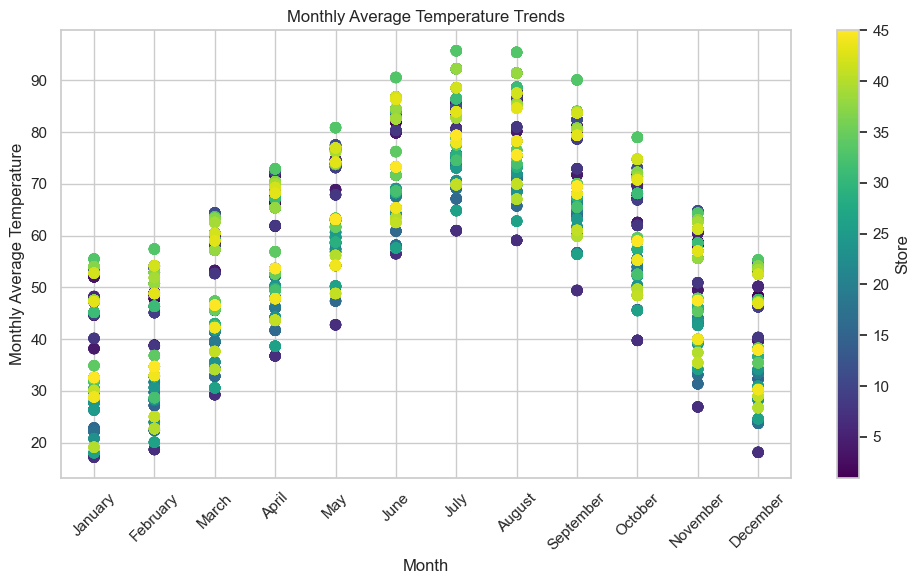

In [200]:
# Plot the monthly average temperature against the months using colormap for 'Store'
plt.figure(figsize=(10, 6))
plt.scatter(df['Date'].dt.month, df['monthly_temp'], c=df['Store'], cmap='viridis', s=50)
# Set labels and title
plt.xlabel('Month')
plt.ylabel('Monthly Average Temperature')
plt.title('Monthly Average Temperature Trends')
# Customize x-axis ticks to show month names
plt.xticks(range(1, 13), calendar.month_name[1:], rotation=45)
# Show a colorbar to indicate the stores
cbar = plt.colorbar()
cbar.set_label('Store')
# Show gridlines
plt.grid(True)
# Show the plot
plt.tight_layout()
plt.show()

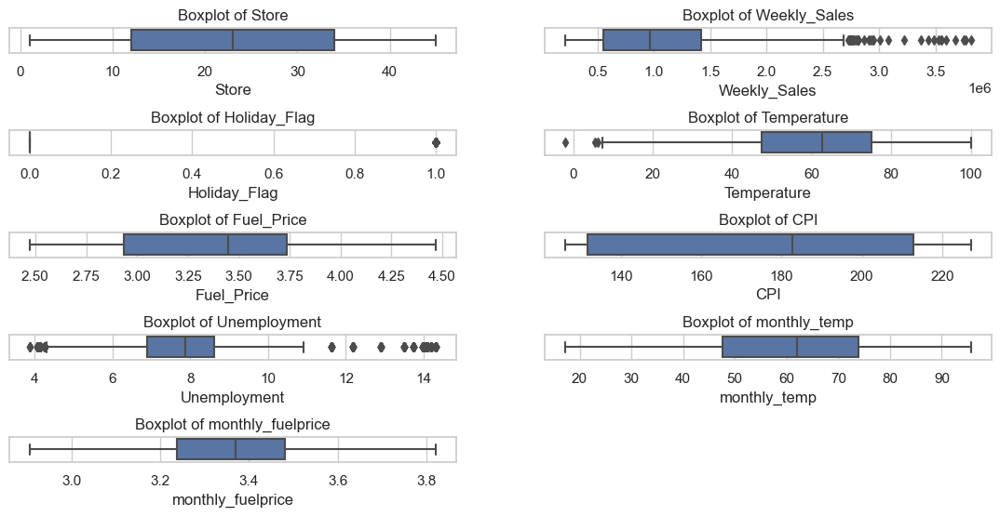

In [206]:
#Let's check outliers value
numeric_columns = df.select_dtypes(exclude=['category', 'object','datetime64[ns]']).columns
num_rows = len(numeric_columns) // 2 + len(numeric_columns) % 2
num_cols = 2

#Let's create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 6))
fig.tight_layout(pad=3.0) 

for idx, column in enumerate(numeric_columns):
    row = idx // num_cols
    col = idx % num_cols
    ax = axes[row, col] if num_rows > 1 else axes[col]  # Handle single-row subplots
    
    sns.boxplot(data=df, x=column, ax=ax)
    ax.set_title(f'Boxplot of {column}')
 
if len(numeric_columns) % 2 != 0:
    fig.delaxes(axes[num_rows - 1, num_cols - 1])

plt.show()

In [207]:
#Let's examine outlier values 
for i in df.select_dtypes(exclude = 'object').drop(columns = ['Holiday_Flag']).columns:
    below_outlier = df[i].mean() - 3*df[i].std()
    above_outlier = df[i].mean() + 3*df[i].std()
    df = df[(df[i] > below_outlier) & (df[i] < above_outlier)]

In [208]:
#Let's find outlier counts
print("·Number of Outliers: ",rows - len(df))

·Number of Outliers:  250


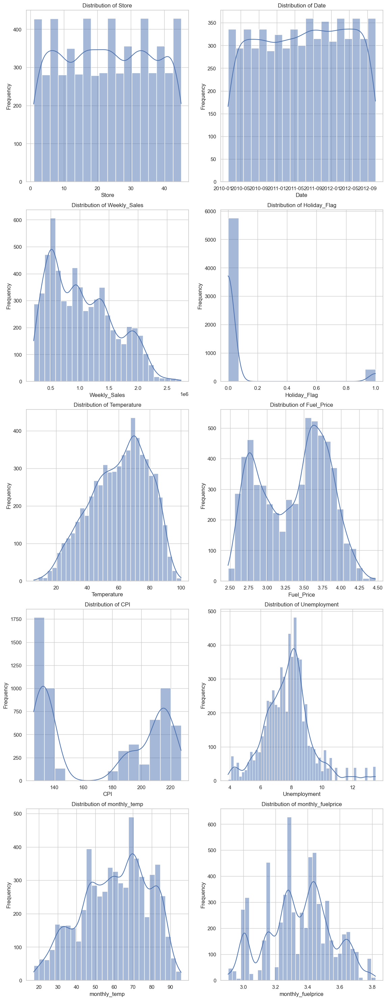

In [209]:
# Display distribution plots for all columns
num_columns = len(df.columns)
num_rows = (num_columns + 1) // 2  # Calculate the number of rows for subplots

fig, axes = plt.subplots(num_rows, 2, figsize=(12, 6*num_rows))
fig.tight_layout(pad=3.0)  # Adjust spacing between subplots

for i, column in enumerate(df.columns):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    
    sns.histplot(data=df[column], kde=True, ax=ax)
    ax.set_title(f'Distribution of {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')

# In case the number of columns is odd, the last subplot might be empty
if num_columns % 2 == 1:
    axes[num_rows - 1, 1].axis('off')

plt.show()

In [210]:
#Let's calculate the skewness of the dataset
for i in df.select_dtypes(exclude = ['object','datetime64[ns]']).columns:
    skewness = skew(df[i])
    print(f"{i} column:")
    print("Skewness:", skewness)
    print('==============================')

Store column:
Skewness: 0.006195661737640821
Weekly_Sales column:
Skewness: 0.5054422972041727
Holiday_Flag column:
Skewness: 3.4048128462918936
Temperature column:
Skewness: -0.3474913617377472
Fuel_Price column:
Skewness: -0.13053732598042556
CPI column:
Skewness: -0.0032675132428642293
Unemployment column:
Skewness: 0.4939602381676155
monthly_temp column:
Skewness: -0.2954239221748522
monthly_fuelprice column:
Skewness: -0.11166189572014752


### Skewness close to 0 (between -0.5 and 0.5): Distribution is approximately symmetric.
### Positive skewness (> 0.5): Right-skewed, with a stretched tail to the right due to larger values.
### Negative skewness (< -0.5): Left-skewed, with a stretched tail to the left due to smaller values.

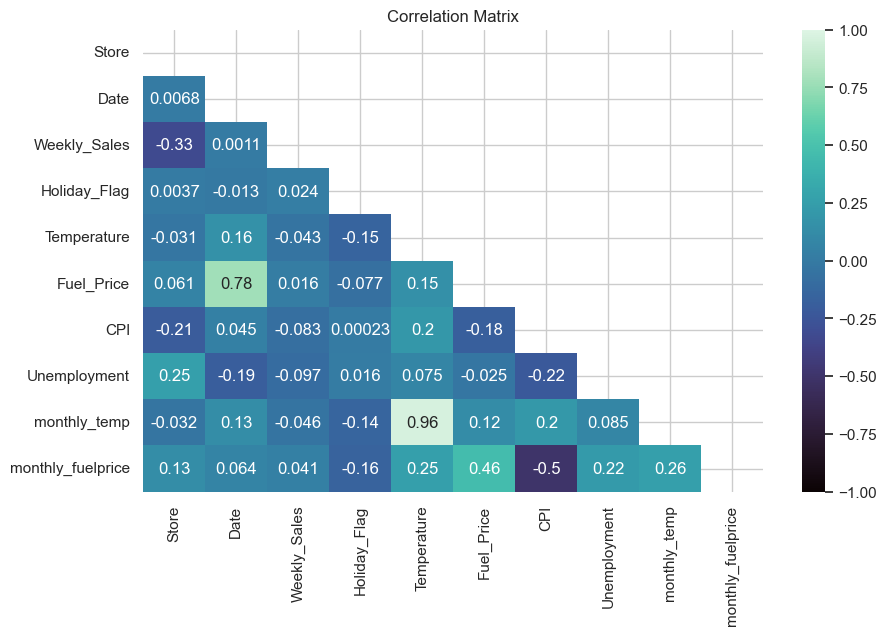

In [211]:
#Let's look at correlations
mask = np.triu(np.ones_like(df.corr(), dtype=bool))
plt.figure(figsize=(10,6))
corr=df.corr()
sns.heatmap(corr,cmap='mako',vmin=-1.0,vmax=1.0, annot=True,mask=mask)
plt.title('Correlation Matrix')
plt.show()

<Figure size 1000x800 with 0 Axes>

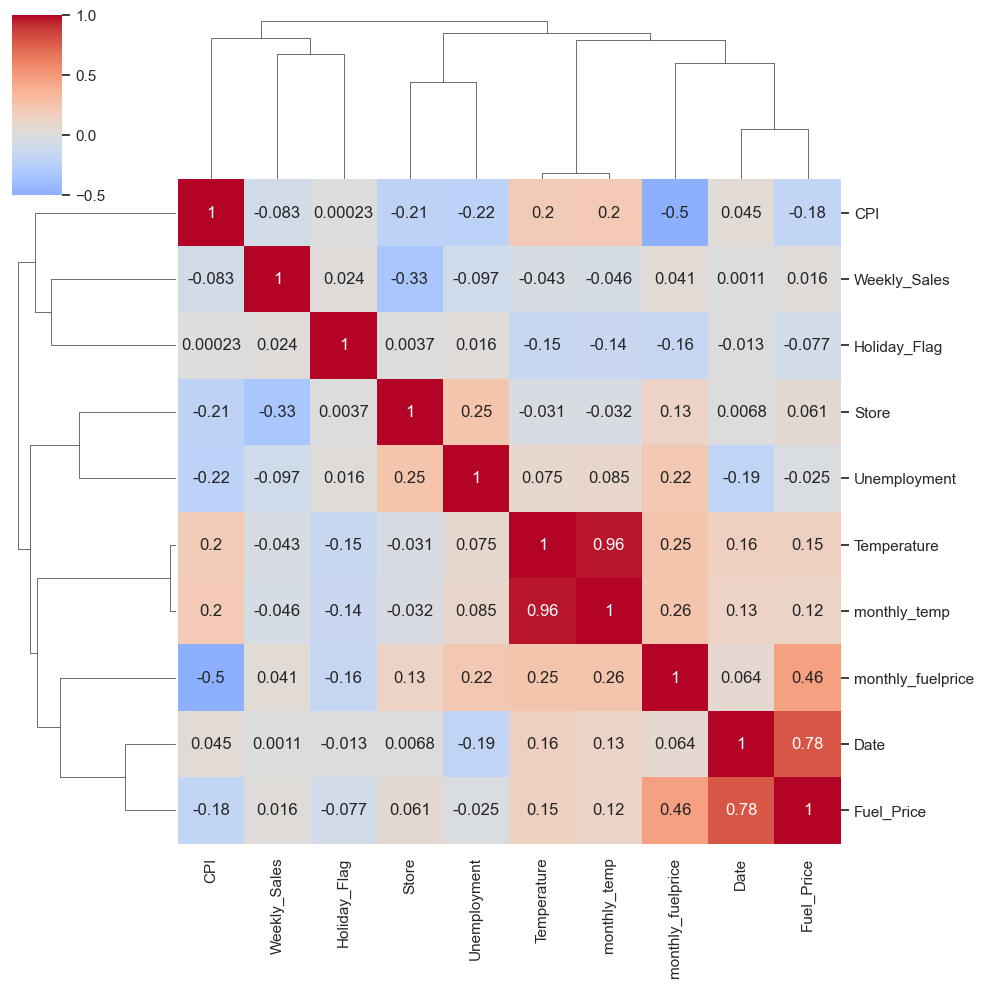

In [212]:
# Calculate the correlation matrix
corr_matrix = df.corr()

# Create a clustered heatmap for the correlation matrix
plt.figure(figsize=(10, 8))
sns.clustermap(corr_matrix, cmap='coolwarm', annot=True, center=0)

# Show the plot
plt.show()

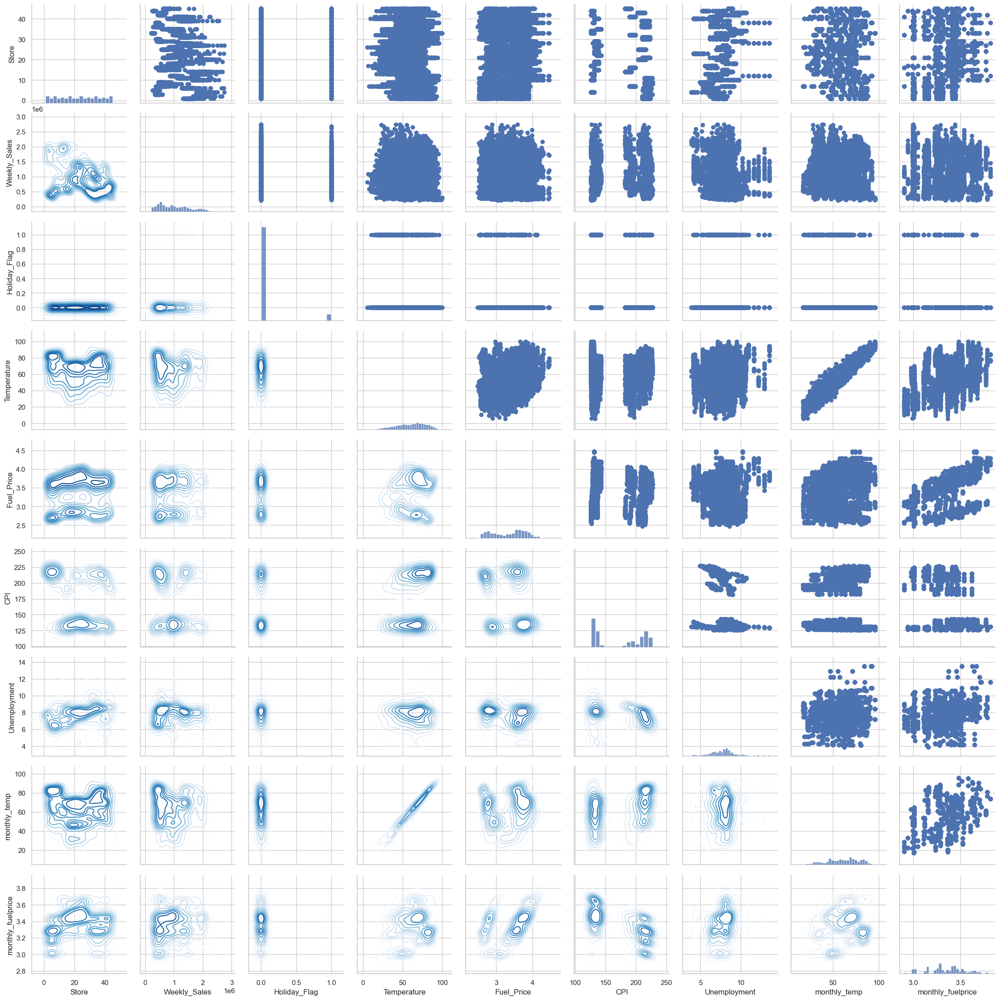

In [213]:
# Calculate the correlation matrix
corr_matrix = df.corr()

# Create a pair grid with correlation coefficients
g = sns.PairGrid(df)
g.map_upper(plt.scatter)
g.map_diag(sns.histplot)
g.map_lower(sns.kdeplot, cmap='Blues')

# Show the plot
plt.show()

In [214]:
#Let's divide date to day , month , year 
df['year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month
df['day'] = df['Date'].dt.day
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,monthly_temp,monthly_fuelprice,year,month,day
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,47.786667,3.012500,2010,2,5
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,47.786667,3.012500,2010,2,12
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,47.786667,3.012500,2010,2,19
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,47.786667,3.012500,2010,2,26
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,59.553077,3.316692,2010,3,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684,69.526154,3.482000,2012,9,28
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667,58.910000,3.405846,2012,10,5
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667,58.910000,3.405846,2012,10,12
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667,58.910000,3.405846,2012,10,19


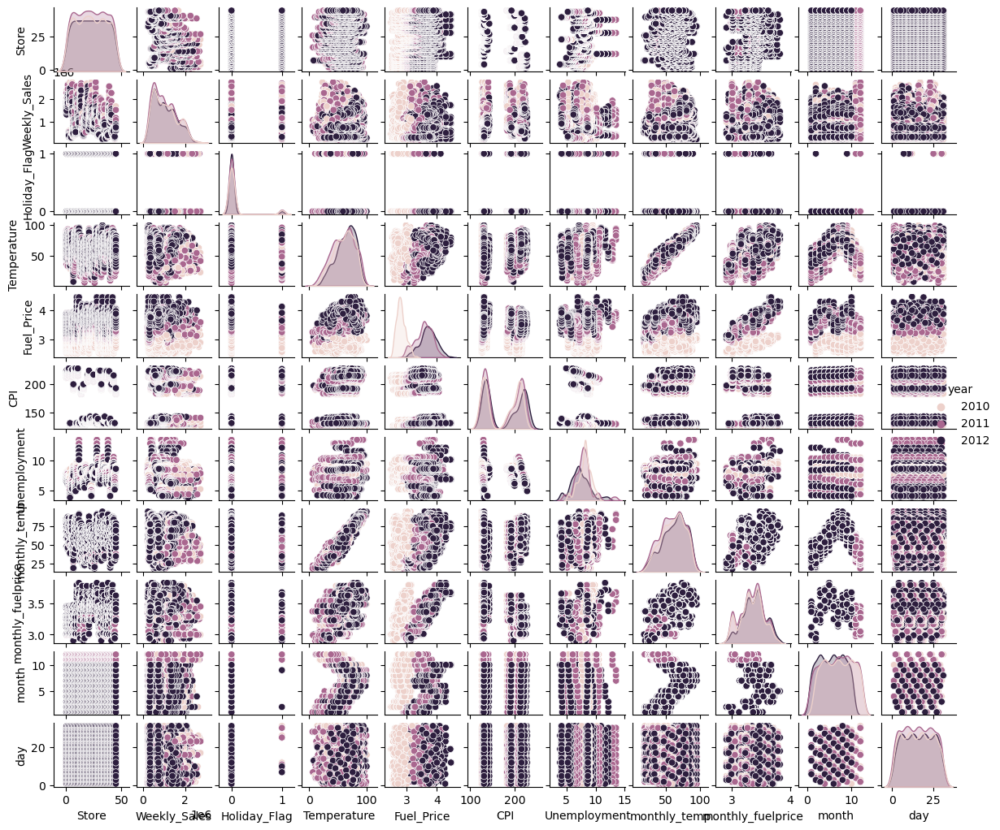

In [43]:
#Let's look at common charts
g = sns.pairplot(df.select_dtypes(exclude = 'object') , hue='year')
g.fig.set_size_inches(12, 10)
plt.show()

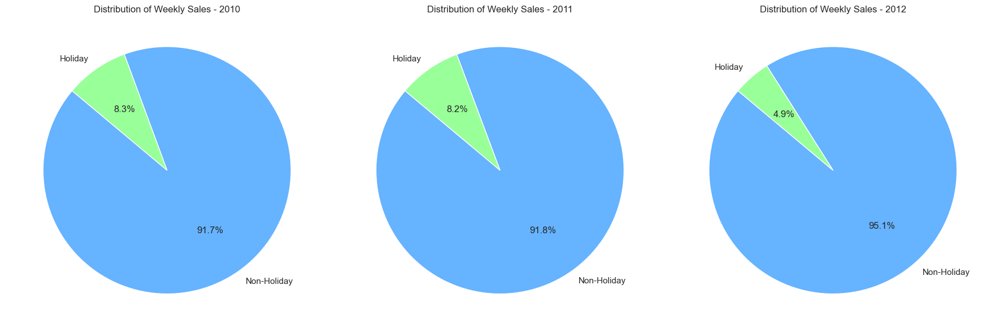

In [216]:
# Group the data by year and holiday flag and calculate the sum of weekly sales
grouped_data = df.groupby(['year', 'Holiday_Flag'])['Weekly_Sales'].sum().reset_index()

years = df['year'].unique()

sns.set(style="whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
# Create a pie chart for each year
for i, year in enumerate(years):
    year_data = grouped_data[grouped_data['year'] == year]
    holiday_labels = ['Non-Holiday', 'Holiday']
    holiday_sizes = year_data['Weekly_Sales']

    ax = axes[i]
    ax.pie(holiday_sizes, labels=holiday_labels, autopct='%1.1f%%', startangle=140, colors=['#66b3ff', '#99ff99'])
    ax.set_title(f'Distribution of Weekly Sales - {year}')
    ax.axis('equal')
plt.tight_layout()
plt.show()

### Result:
#### Weekly sales during the holidays decrease as the year increases

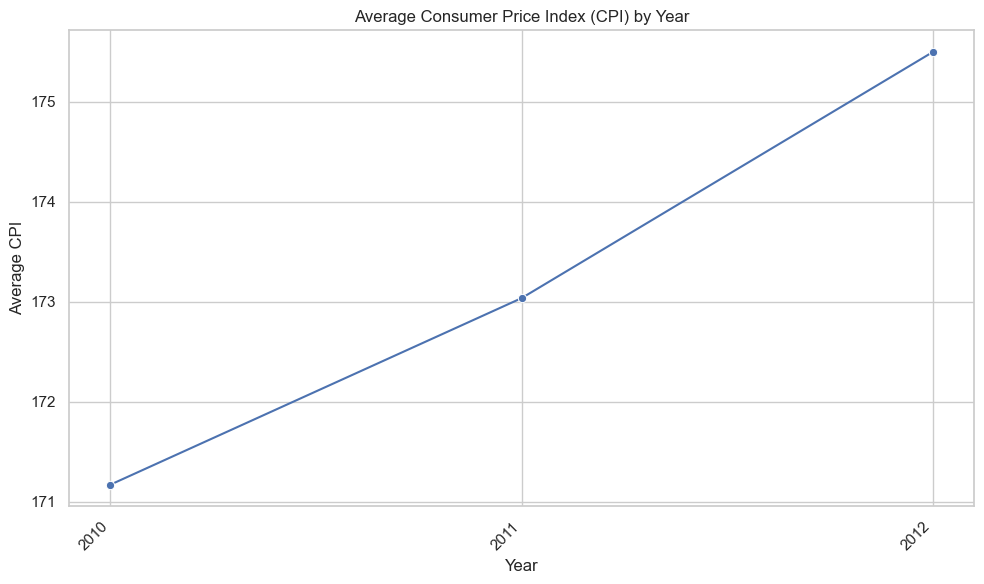

In [217]:
# Group the data by year and calculate the mean CPI
df_cpi = df.groupby('year')['CPI'].mean().reset_index()

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.lineplot(x='year', y='CPI', data=df_cpi, marker='o')

plt.title('Average Consumer Price Index (CPI) by Year')
plt.xlabel('Year')
plt.ylabel('Average CPI')
plt.xticks(df_cpi['year'], rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Result:
##### If the Consumer Price Index (CPI) values increase from year to year, this indicates inflation. This means that the prices of goods and services rise, which leads to a decrease in purchasing power.

### Let's look at weekly sales by year
#### Which year has the best weekly sales?
#### Let's look at Increase and decrease also

Text(0.5, 1.0, 'Annual Sales Chart')

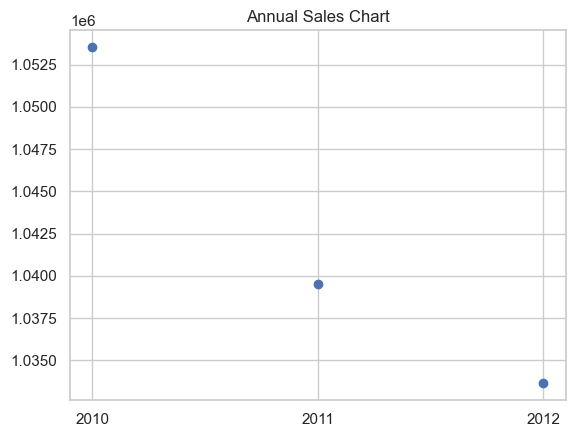

In [218]:
#Let's look at annual sales
plt.scatter(df.groupby(by = 'year')['Weekly_Sales'].mean().index ,
            list(df.groupby(by = 'year')['Weekly_Sales'].mean()) )
plt.xticks(df.groupby(by = 'year')['Weekly_Sales'].mean().index )
plt.title('Annual Sales Chart')

## Let's look at weekly sales by month
#### Which month has the best weekly sales?
#### Let's look at Increase and decrease 

Text(0.5, 1.0, 'Monthly Sales Chart')

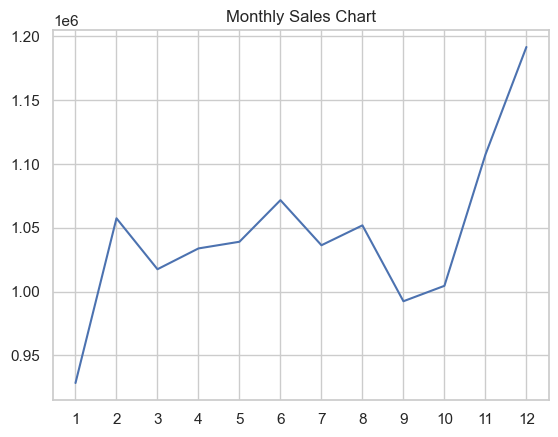

In [219]:
#Let's look at monthly sales
plt.plot(df.groupby(by = 'month')['Weekly_Sales'].mean().index ,
            list(df.groupby(by = 'month')['Weekly_Sales'].mean()) )
plt.xticks(df.groupby(by = 'month')['Weekly_Sales'].mean().index )
plt.title('Monthly Sales Chart') 

#### Feature Mining

In [220]:
#Let's create new feature which 
df['behaviour'] = df['month'].apply(lambda x: 0 if x > 2 and x < 10 else 1)

In [221]:
#Let's examine sales as temperature
df['temp_bins'] = pd.cut(df['Temperature'], bins=[-3,20,40,60,80,101], 
                        labels=['+20','20-40','40-60','60-80','80+'], include_lowest=True)

### Let's look at weekly sales by age category
#### Which age group has the best weekly sales?
#### Let's look at Increase and decrease also

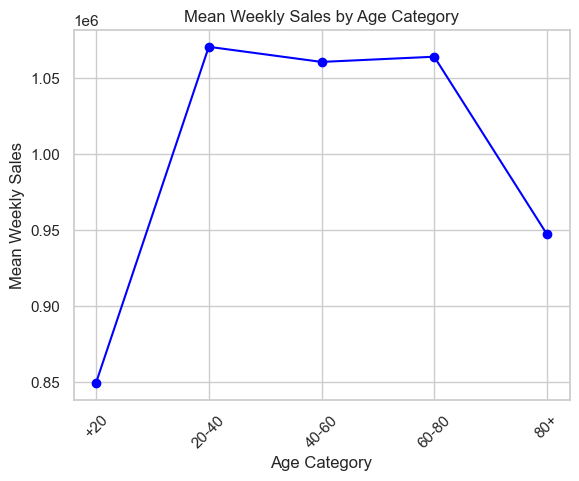

In [222]:
#Let's look at addiction
mean_weekly_sales = df.groupby(by = 'temp_bins')['Weekly_Sales'].mean()

# Plot the data
plt.plot(mean_weekly_sales.index, mean_weekly_sales.values, marker='o', color='blue')
plt.xlabel('Age Category')
plt.ylabel('Mean Weekly Sales')
plt.title('Mean Weekly Sales by Age Category')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

#### Feature Mining

In [223]:
#Let's create new features
df['temp_div'] = df['temp_bins'].apply(lambda x: 1 if x == '+20' else 0)

In [224]:
#Let's look at that how to change weekly sales as CPI
df['CPI_cat'] = pd.cut(df['CPI'],bins = [126,140,160,200,240] , 
                   labels = ['126-140','140-160','180-200','200+'],include_lowest= True)

### Let's look at weekly sales by CPI category
#### Which CPI category has the best weekly sales?
#### Let's look at Increase and decrease also

In [225]:
#Let's look at dependence
df.groupby(by = 'CPI_cat')['Weekly_Sales'].mean()

CPI_cat
126-140    1.076681e+06
140-160    1.202953e+06
180-200    1.045694e+06
200+       9.895979e+05
Name: Weekly_Sales, dtype: float64

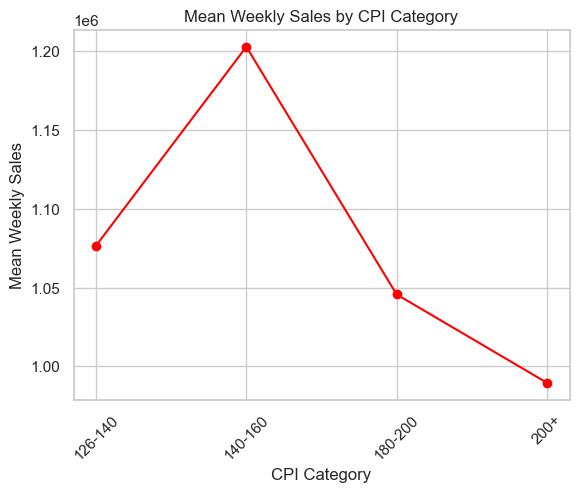

In [226]:
#Let's look at addiction
mean_weekly_sales = df.groupby(by='CPI_cat')['Weekly_Sales'].mean()

# Plot the data
plt.plot(mean_weekly_sales.index, mean_weekly_sales.values, marker='o', color='red')
plt.xlabel('CPI Category')
plt.ylabel('Mean Weekly Sales')
plt.title('Mean Weekly Sales by CPI Category')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

#### Feature Mining

In [227]:
#Let's divide dataset from 140-160 point
df['CPI_cat'] = df['CPI_cat'].apply(lambda x: 1 if x in ['126-140','140-160'] else 0)

In [229]:
#Let's look at count values
df['CPI_cat'].value_counts()

CPI_cat
0    3275
1    2910
Name: count, dtype: int64

In [230]:
print('·Min:' , df['Fuel_Price'].min(), '\n·Max:' ,df['Fuel_Price'].max())

·Min: 2.472 
·Max: 4.468


### Let's look at weekly sales by Fuel Price Category
#### Which Fuel Price Category has the best weekly sales?
#### Let's look at Increase and decrease also

In [231]:
#Let's divide dataset fuel price categories
df['Fuel_Cat'] = pd.cut(df['Fuel_Price'] , 
                    bins = [2.47, 2.7 , 3.0 , 3.3 , 3.6 , 3.9 , 4.2 , 4.5],
                    labels = ['2.47-2.7','2.7-3','3-3.3','3.3-3.6','3.6-3.9','3.9-4.2'
                             ,'4.2+'], include_lowest = True)

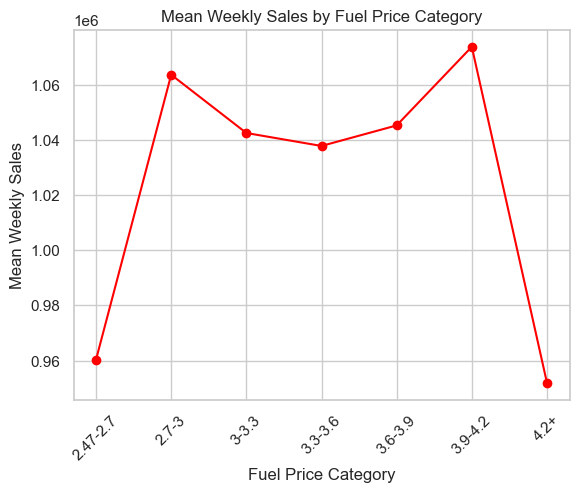

In [232]:
#Let's look at addiction
mean_weekly_sales = df.groupby(by='Fuel_Cat')['Weekly_Sales'].mean()

# Plot the data
plt.plot(mean_weekly_sales.index, mean_weekly_sales.values, marker='o', color='red')
plt.xlabel('Fuel Price Category')
plt.ylabel('Mean Weekly Sales')
plt.title('Mean Weekly Sales by Fuel Price Category')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

#### Feature Mining

In [233]:
#Let's divide dataset as Fuel Price Category
df['Fuel_Cat'] = df['Fuel_Cat'].apply(lambda x: 1 if x in ['2.47-2.7','2.7-3','3.6-3.9','3.9-4.2'] else 0)

In [235]:
#Let's look at value counts
df['Fuel_Cat'].value_counts()

Fuel_Cat
1    4116
0    2069
Name: count, dtype: int64

### Let's look at weekly sales by Holiday Flag
#### Which Holiday Flag has the best weekly sales?
#### Let's look at Increase and decrease also 

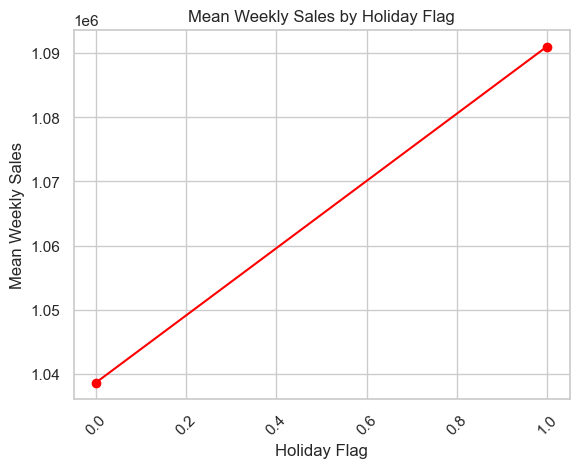

In [236]:
#Let's look at addiction
mean_weekly_sales = df.groupby(by = 'Holiday_Flag')['Weekly_Sales'].mean()

# Plot the data
plt.plot(mean_weekly_sales.index, mean_weekly_sales.values, marker='o', color='red')
plt.xlabel('Holiday Flag')
plt.ylabel('Mean Weekly Sales')
plt.title('Mean Weekly Sales by Holiday Flag')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

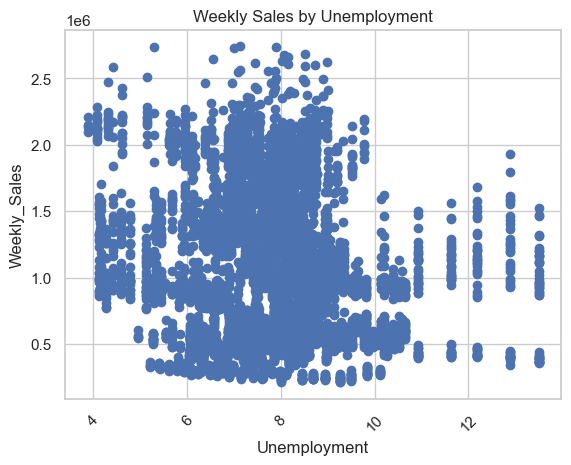

In [238]:
#Let's look at addiction
plt.scatter(df['Unemployment'],df['Weekly_Sales'])
plt.xlabel('Unemployment')
plt.ylabel('Weekly_Sales')
plt.title('Weekly Sales by Unemployment')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

In [240]:
print('·Min:' , df['Unemployment'].min(), '\n·Max:' ,df['Unemployment'].max())

·Min: 3.879 
·Max: 13.503


In [241]:
df['Unemployment_cat'] = pd.cut(df['Unemployment'] , 
                                bins = [3,5,7,9,11,13,15] , 
                                labels = ['3-5','5-7','7-9','9-11','11-13','13+'])

### Let's look at weekly sales by Unemployment Rate Category
#### Which Unemployment Rate Category has the best weekly sales?
#### Let's look at Increase and decrease also

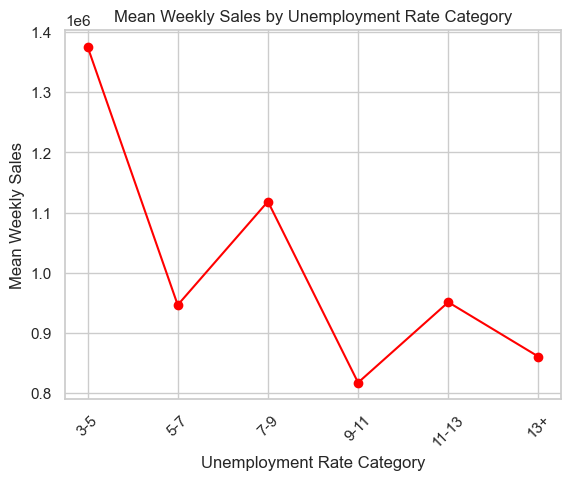

In [242]:
#Let's look at addiction
mean_weekly_sales = df.groupby(by = 'Unemployment_cat')['Weekly_Sales'].mean()

# Plot the data
plt.plot(mean_weekly_sales.index, mean_weekly_sales.values, marker='o', color='red')
plt.xlabel('Unemployment Rate Category')
plt.ylabel('Mean Weekly Sales')
plt.title('Mean Weekly Sales by Unemployment Rate Category')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

In [243]:
#Let's divide dataset as Unemployment Rate Category
df['Unemployment_Cat'] = df['Unemployment_cat'].apply(lambda x: 1 
                                                      if x in ['5-7','7-9','9-11','11-13'] else 0)

In [244]:
#Let's remove date columns
del df['Date']

### Let's examine Correlation between columns

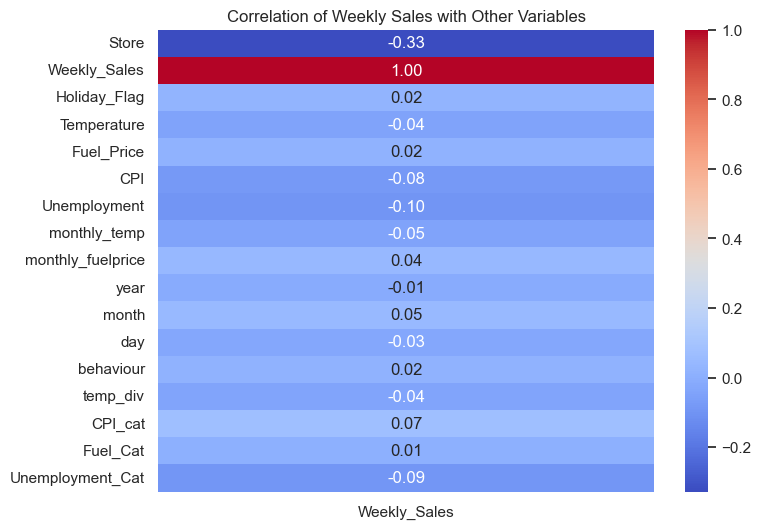

In [245]:
#Let's look at correlation 
# Calculate the correlation matrix
correlation_matrix = df.select_dtypes(exclude = 'category').corr()['Weekly_Sales']

# Create a heatmap
plt.figure(figsize=(8, 6))  # Adjust the figure size if needed
sns.heatmap(correlation_matrix.to_frame(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation of Weekly Sales with Other Variables')
plt.show()

In [246]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

df_pca = df.select_dtypes(exclude = ['object', 'string','category'] ).drop(
    columns = ['Weekly_Sales','Store','year','month','day'])

# Standardize the features
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[['CPI','Temperature']])
df_pca[['CPI','Temperature']] = scaled_data
df_pca.isnull().sum()
# Apply PCA
pca = PCA(n_components=2)  # Choose the number of components you want to retain
principal_components = pca.fit_transform(df_pca)

In [247]:
df[['X_pca','X_pca2']] = principal_components

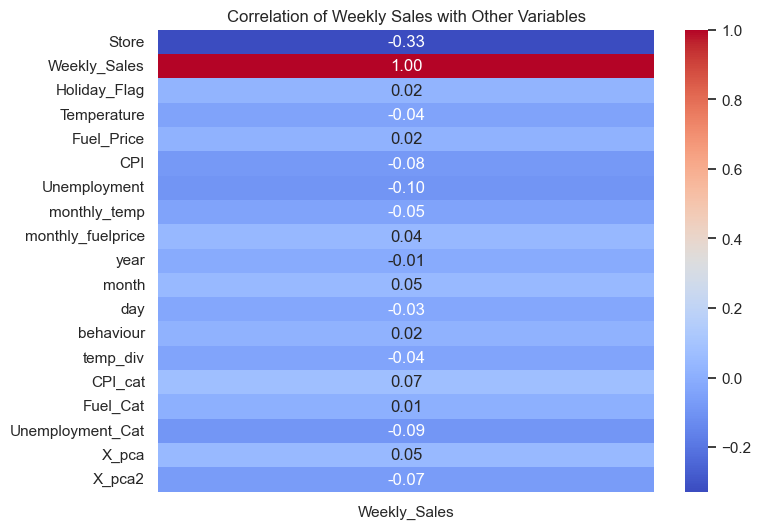

In [248]:
#Let's look at correlation 
# Calculate the correlation matrix
correlation_matrix = df.select_dtypes(exclude = 'category').corr()['Weekly_Sales']

# Create a heatmap
plt.figure(figsize=(8, 6))  # Adjust the figure size if needed
sns.heatmap(correlation_matrix.to_frame(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation of Weekly Sales with Other Variables')
plt.show()

### Result:
#### We determine that the correlation with the target value is bad 

In [249]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

z = df.select_dtypes(exclude = ['object','category'])
vif_data = pd.DataFrame()
vif_data["feature"] = z.columns
vif_data["VIF"] = [variance_inflation_factor(z.values, i)
                          for i in range(len(z.columns))]
print(vif_data)

              feature       VIF
0               Store  1.316527
1        Weekly_Sales  1.195166
2        Holiday_Flag       inf
3         Temperature       inf
4          Fuel_Price       inf
5                 CPI       inf
6        Unemployment       inf
7        monthly_temp       inf
8   monthly_fuelprice       inf
9                year  4.350343
10              month  1.615016
11                day  1.016690
12          behaviour       inf
13           temp_div       inf
14            CPI_cat       inf
15           Fuel_Cat       inf
16   Unemployment_Cat       inf
17              X_pca       inf
18             X_pca2       inf


In [250]:
#Let's exclude object , category columns from data frame   
df = df.select_dtypes(exclude = ['object','category'])

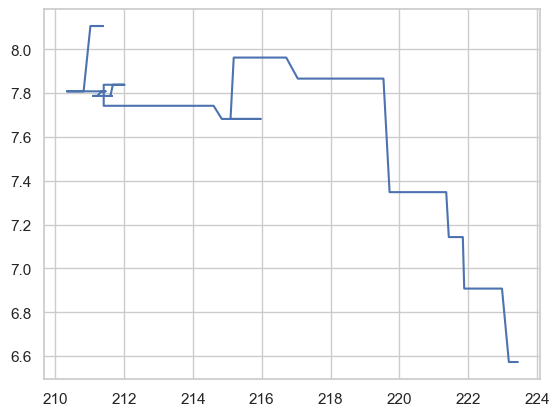

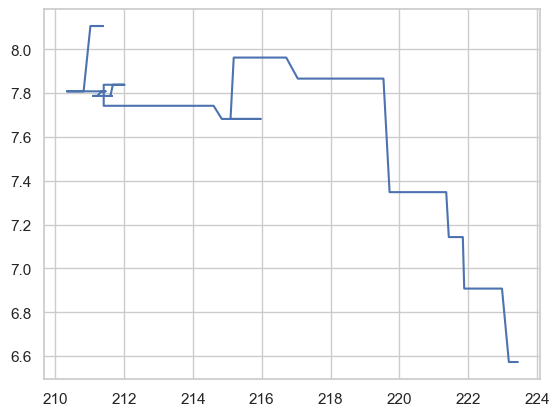

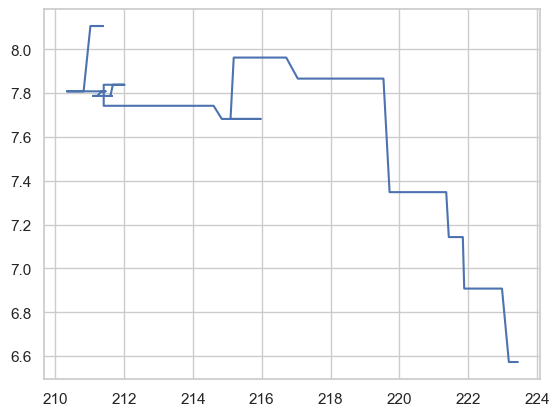

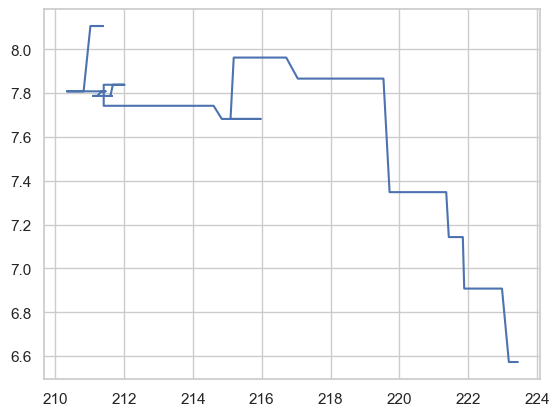

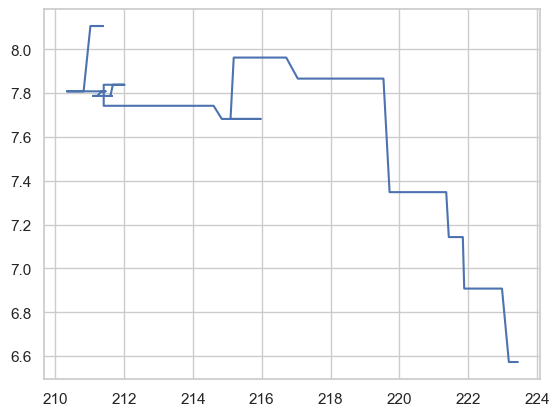

...

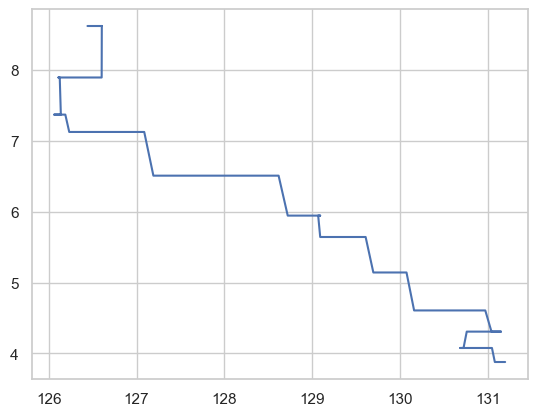

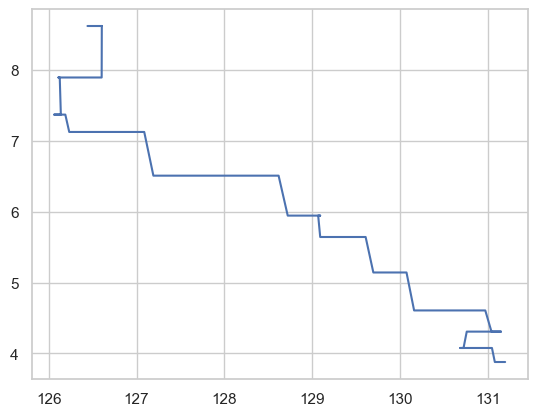

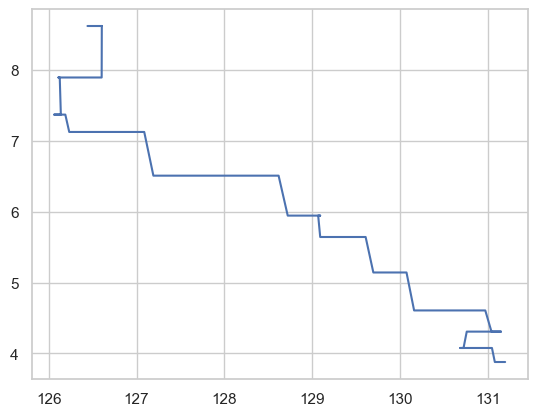

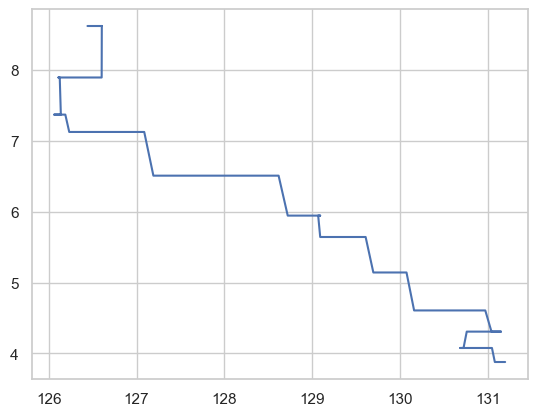

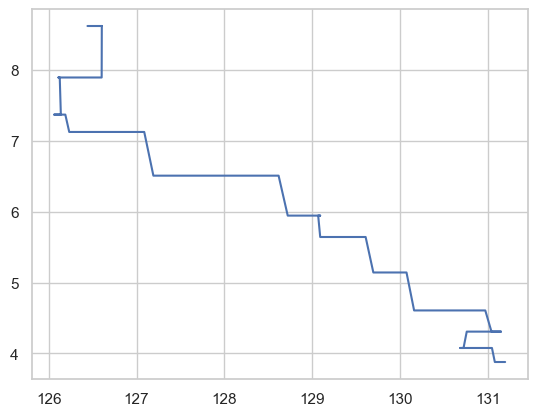

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

In [84]:
#Let's find addiction of CPI and unemployment rate for all store in same chart
for i in df['Store']:
    x = df[df['Store'] == i]  
    plt.plot(x['CPI'],x['Unemployment'])
    plt.show()

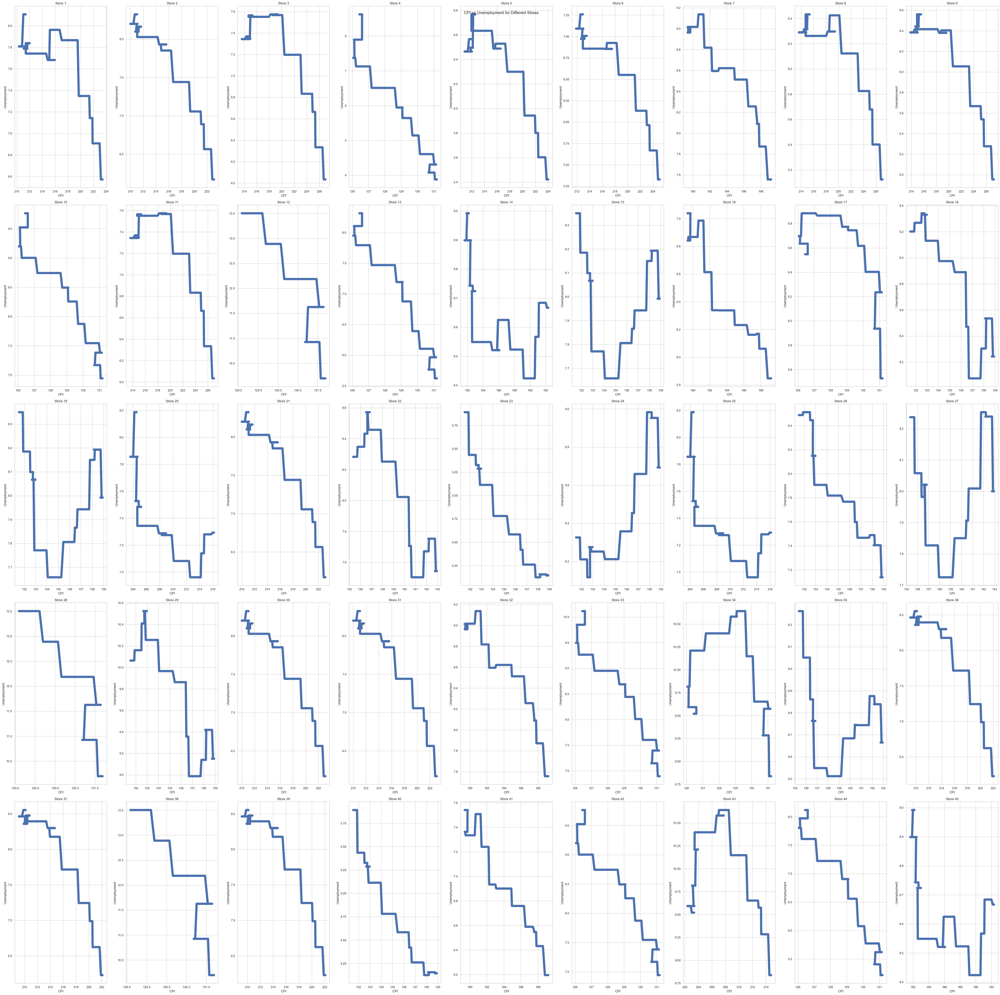

In [85]:
#Let's find addiction of CPI and unemployment rate for all store
unique_stores = df['Store'].unique()
num_stores = len(unique_stores)
num_cols = 9  # Number of columns in the subplot grid
num_rows = 5  # Calculate the number of rows needed

fig, axes = plt.subplots(num_rows, num_cols, figsize=(50, 10*num_rows))
fig.suptitle("CPI vs Unemployment for Different Stores")

for i, store in enumerate(unique_stores):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    
    x = df[df['Store'] == store]
    ax.plot(x['CPI'], x['Unemployment'] , lw = 8)
    ax.set_title(f'Store {store}')
    ax.set_xlabel('CPI')
    ax.set_ylabel('Unemployment')

# Adjust layout
plt.tight_layout()
plt.show()

### Result:
#### We define addiction between CPI and Unemployment Rate

In [254]:
#Let's load data frame
df1=pd.read_csv('walmart.csv')
df['Date'] = df1['Date']

In [255]:
def week_of_month(date):
    first_day = date.replace(day=1)
    day_offset = first_day.weekday()
    return (date.day + day_offset - 1) // 7 + 1

# Convert the 'Date' column to datetime format
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')

# Apply the week_of_month function to calculate the week of the month
df['Week_day'] = df['Date'].apply(week_of_month)

In [256]:
#Data Frame
df

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,monthly_temp,monthly_fuelprice,year,...,behaviour,temp_div,CPI_cat,Fuel_Cat,Unemployment_Cat,X_pca,X_pca2,Date,index,Week_day
0,1,1643690.90,0,42.31,2.572,211.096358,8.106,47.786667,3.012500,2010,...,1,0,0,1,1,12.750156,0.018756,2010-02-05,0,1
1,1,1641957.44,1,38.51,2.548,211.242170,8.106,47.786667,3.012500,2010,...,1,0,0,1,1,12.763350,0.021631,2010-02-12,1,2
2,1,1611968.17,0,39.93,2.514,211.289143,8.106,47.786667,3.012500,2010,...,1,0,0,1,1,12.757267,0.017679,2010-02-19,2,3
3,1,1409727.59,0,46.63,2.561,211.319643,8.106,47.786667,3.012500,2010,...,1,0,0,1,1,12.737455,0.016025,2010-02-26,3,4
4,1,1554806.68,0,46.50,2.625,211.350143,8.106,59.553077,3.316692,2010,...,0,0,0,1,1,0.974615,-0.016203,2010-03-05,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6430,45,713173.95,0,64.88,3.997,192.013558,8.684,69.526154,3.482000,2012,...,0,0,0,1,1,-9.038704,0.649950,2012-09-28,6180,5
6431,45,733455.07,0,64.89,3.985,192.170412,8.667,58.910000,3.405846,2012,...,1,0,0,1,1,1.575453,0.670549,2012-10-05,6181,1
6432,45,734464.36,0,54.47,4.000,192.327265,8.667,58.910000,3.405846,2012,...,1,0,0,1,1,1.605921,0.672080,2012-10-12,6182,2
6433,45,718125.53,0,56.47,3.969,192.330854,8.667,58.910000,3.405846,2012,...,1,0,0,1,1,1.600154,0.671408,2012-10-19,6183,3


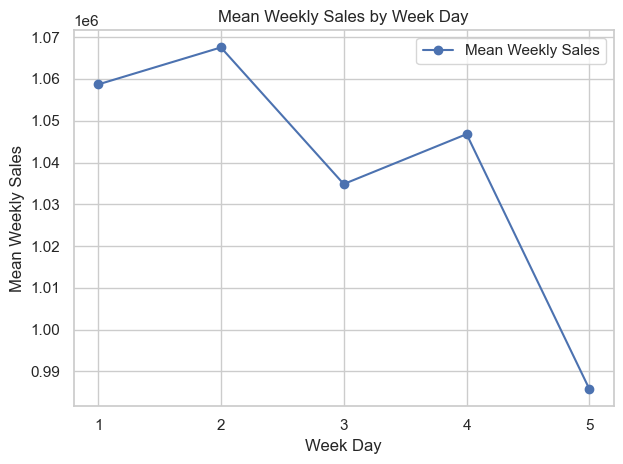

In [257]:
#Let's find average weekly sales as week of momnth
mean_sales = df.groupby(by='Week_day')['Weekly_Sales'].mean()

plt.plot(mean_sales.index, mean_sales.values, marker='o', linestyle='-', color='b', label='Mean Weekly Sales')
plt.xlabel('Week Day')
plt.ylabel('Mean Weekly Sales')
plt.title('Mean Weekly Sales by Week Day')
plt.xticks(mean_sales.index)  # Set x-axis tick labels to match weekdays
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### Result:
#### We define general sales by weeks of month

In [259]:
t = []
for i in df['Store'].unique():
    d = df[df['Store'] == i]
    a = d.groupby(by= 'Week_day')['Weekly_Sales'].mean()
    t.append(dict(a))

In [260]:
# Dictionary
t

[{1: 1593657.3033333335,
  2: 1607799.9318181819,
  3: 1560318.4039393938,
  4: 1539794.622121212,
  5: 1439695.298},
 {1: 1948562.5525,
  2: 1954421.4251515153,
  3: 1931458.3460606062,
  4: 1868173.7283870967,
  5: 1790457.2105},
 {1: 419378.7083333333,
  2: 408603.1060606061,
  3: 397588.0309090909,
  4: 405648.4333333333,
  5: 376547.0125},
 {1: 2076881.9429166669,
  2: 2097048.2406060605,
  3: 2091354.5084375,
  4: 2021767.258275862,
  5: 1958646.4364999998},
 {1: 330488.8575,
  2: 320044.78909090906,
  3: 309583.3609090909,
  4: 323418.3827272727,
  5: 304671.037},
 {1: 1593842.1554166665,
  2: 1585342.9542424243,
  3: 1551421.9948484849,
  4: 1591724.6945454546,
  5: 1473188.0335000001},
 {1: 555945.3173913044,
  2: 575665.4245454544,
  3: 557315.0678787879,
  4: 598012.0812121212,
  5: 556537.507},
 {1: 920641.0175000001,
  2: 924976.106969697,
  3: 910800.2327272727,
  4: 920013.0696969697,
  5: 845737.3099999999},
 {1: 555911.61125,
  2: 549877.5927272727,
  3: 534723.9084848

In [261]:
#Let's create a new column and record the average sales of the weeks of the month for each store 
df['WeeklyAvg_Sales'] = df.apply(lambda row: t[row['Store'] - 1].get(row['Week_day']), axis=1)

In [262]:
df[df['Store']==2]

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,monthly_temp,monthly_fuelprice,year,...,temp_div,CPI_cat,Fuel_Cat,Unemployment_Cat,X_pca,X_pca2,Date,index,Week_day,WeeklyAvg_Sales
143,2,2136989.46,0,40.19,2.572,210.752605,8.324,46.265000,3.012500,2010,...,0,0,1,1,14.273944,0.233582,2010-02-05,143,1,1.948563e+06
144,2,2137809.50,1,38.49,2.548,210.897994,8.324,46.265000,3.012500,2010,...,0,0,1,1,14.280978,0.235939,2010-02-12,144,2,1.954421e+06
145,2,2124451.54,0,39.69,2.514,210.945160,8.324,46.265000,3.012500,2010,...,0,0,1,1,14.275541,0.232040,2010-02-19,145,3,1.931458e+06
146,2,1865097.27,0,46.10,2.561,210.975957,8.324,46.265000,3.012500,2010,...,0,0,1,1,14.256579,0.230456,2010-02-26,146,4,1.868174e+06
147,2,1991013.13,0,47.17,2.625,211.006754,8.324,58.703077,3.316692,2010,...,0,0,1,1,1.819704,0.195854,2010-03-05,147,1,1.948563e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281,2,1746470.56,0,79.45,3.666,222.616433,6.565,79.923846,3.277615,2012,...,0,0,1,1,-19.453203,-1.628956,2012-09-28,279,5,1.790457e+06
282,2,1998321.04,0,70.27,3.617,222.815930,6.170,67.236154,3.153769,2012,...,0,0,1,1,-6.741105,-1.961232,2012-10-05,280,1,1.948563e+06
283,2,1900745.13,0,60.97,3.601,223.015426,6.170,67.236154,3.153769,2012,...,0,0,1,1,-6.713835,-1.960436,2012-10-12,281,2,1.954421e+06
284,2,1847990.41,0,68.08,3.594,223.059808,6.170,67.236154,3.153769,2012,...,0,0,0,1,-6.730456,-1.997887,2012-10-19,282,3,1.931458e+06


#### Checking

In [263]:
t[1]

{1: 1948562.5525,
 2: 1954421.4251515153,
 3: 1931458.3460606062,
 4: 1868173.7283870967,
 5: 1790457.2105}

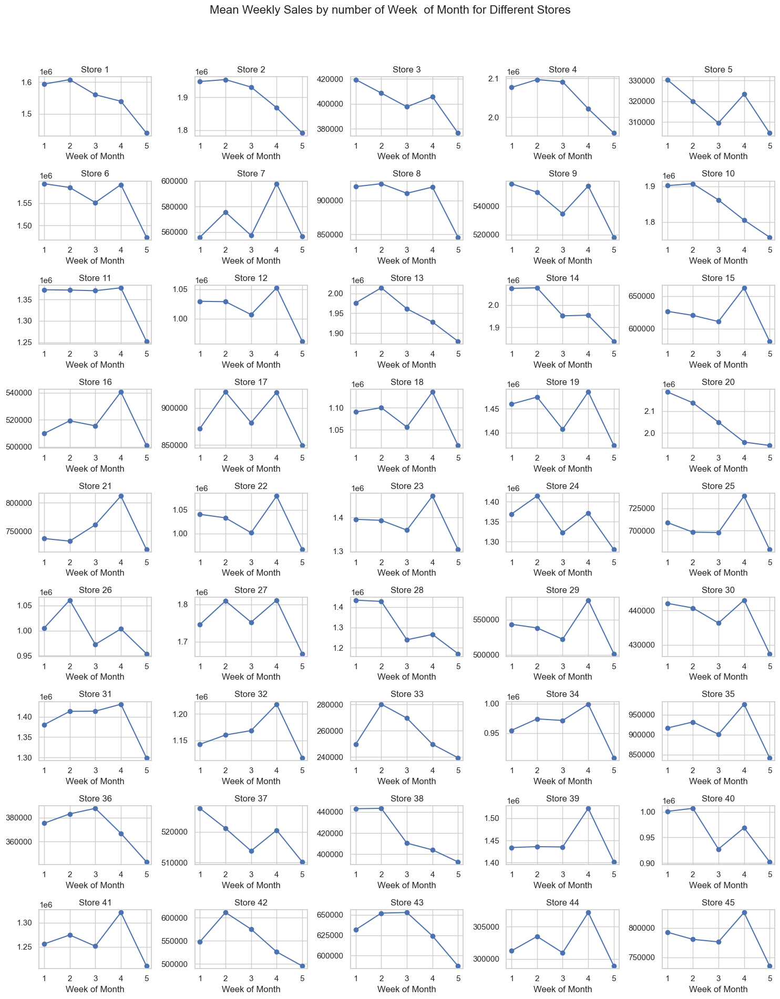

In [264]:
#Let's find average weekly sales as week of momnth for each store
unique_stores = df['Store'].unique()
num_stores = len(unique_stores)
num_rows = 9  # Number of rows in the subplot grid
num_cols = 5  # Number of columns in the subplot grid

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 20))
fig.suptitle("Mean Weekly Sales by number of Week  of Month for Different Stores", fontsize=16)

for i, store in enumerate(unique_stores):
    d = df[df['Store'] == store]
    mean_sales = d.groupby(by='Week_day')['Weekly_Sales'].mean()
    
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]

    ax.plot(mean_sales.index, mean_sales.values, marker='o', linestyle='-', color='b', label='Mean Weekly Sales')
    ax.set_xlabel('Week of Month')
    ax.set_title(f'Store {store}')
    ax.set_xticks(mean_sales.index)  
    ax.grid(True)
# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Result:
#### We determine which week of the month has the highest sales

In [265]:
#Let's find price change 
df['next_day'] = df['Weekly_Sales'].shift(1)
df['next_day'].fillna(0 , inplace = True)
df['Price_diff'] = df['Weekly_Sales'] - df['next_day']

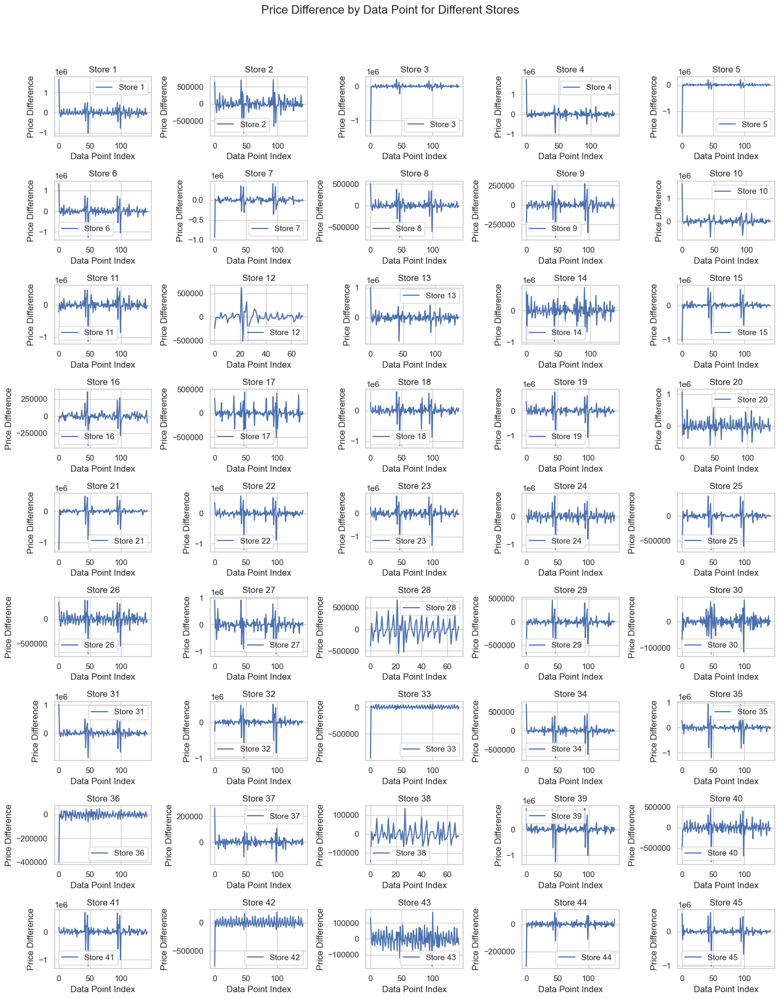

In [266]:
#Let's 
unique_stores = df['Store'].unique()
num_stores = len(unique_stores)
num_rows = 9  
num_cols = 5  

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 20))
fig.suptitle("Price Difference by Data Point for Different Stores", fontsize=16)

for i, store in enumerate(unique_stores):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    
    d = df[df['Store'] == store]
    ax.plot(np.arange(len(d)), d['Price_diff'], label=f'Store {store}')
    
    ax.set_title(f'Store {store}')
    ax.set_xlabel('Date')
    ax.set_ylabel('Price Difference')
    ax.legend()

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Add space for the title
plt.show()

### Result:
#### We determine the dynamic change of sales by week of the month for each store

In [268]:
X = df.drop(columns = 'Weekly_Sales')
y = df['Weekly_Sales'] 

In [270]:
thebest_store = list(df.groupby(by = 'Store')['Weekly_Sales'].mean().sort_values()[:5].index)
df['thebest_store'] = df['Store'].apply(lambda x: x if x in thebest_store  else 'other') 

In [271]:
df = pd.get_dummies(df , columns = ['thebest_store'])

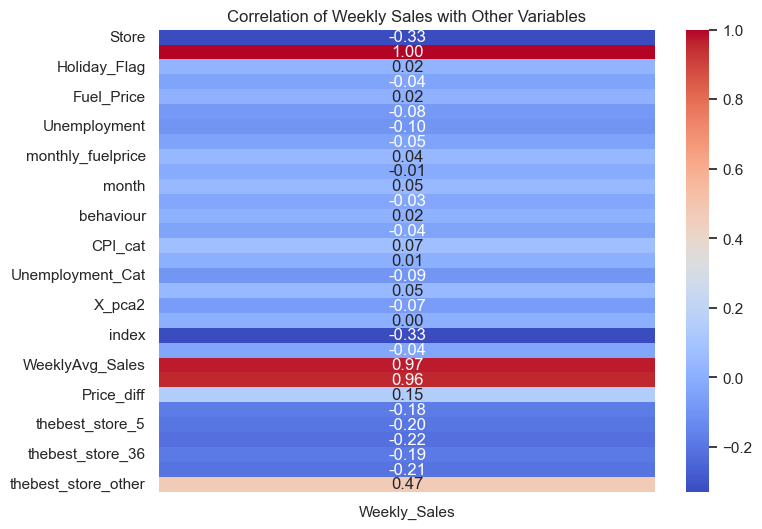

In [272]:
# Calculate the correlation matrix
correlation_matrix = df.corr()['Weekly_Sales']

# Create a heatmap
plt.figure(figsize=(8, 6))  # Adjust the figure size if needed
sns.heatmap(correlation_matrix.to_frame(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation of Weekly Sales with Other Variables')
plt.show()

In [273]:
df.corr()['Weekly_Sales']

Store                 -0.327751
Weekly_Sales           1.000000
Holiday_Flag           0.024166
Temperature           -0.042591
Fuel_Price             0.016420
CPI                   -0.083380
Unemployment          -0.096659
monthly_temp          -0.045785
monthly_fuelprice      0.041405
year                  -0.014457
month                  0.049071
day                   -0.031065
behaviour              0.018862
temp_div              -0.041449
CPI_cat                0.073375
Fuel_Cat               0.007265
Unemployment_Cat      -0.093931
X_pca                  0.045885
X_pca2                -0.069893
Date                   0.001147
index                 -0.328315
Week_day              -0.036748
WeeklyAvg_Sales        0.969592
next_day               0.955027
Price_diff             0.149077
thebest_store_3       -0.178992
thebest_store_5       -0.202696
thebest_store_33      -0.218972
thebest_store_36      -0.187163
thebest_store_44      -0.206968
thebest_store_other    0.467567
Name: We

In [274]:
d.dtypes

Store                         int64
Weekly_Sales                float64
Holiday_Flag                  int64
Temperature                 float64
Fuel_Price                  float64
CPI                         float64
Unemployment                float64
monthly_temp                float64
monthly_fuelprice           float64
year                          int32
month                         int32
day                           int32
behaviour                     int64
temp_div                      int64
CPI_cat                       int64
Fuel_Cat                      int64
Unemployment_Cat              int64
X_pca                       float64
X_pca2                      float64
Date                 datetime64[ns]
index                         int64
Week_day                      int64
WeeklyAvg_Sales             float64
next_day                    float64
Price_diff                  float64
dtype: object

In [275]:
for i in d.select_dtypes(exclude = ['category','datetime64']).columns:
    df[i].corr(df['Weekly_Sales'])
    corr = df[i].corr(df['Weekly_Sales'])
    print(f"Column: {i}    |    Corr: {corr}")
d['X_pca2'] = 'X_pca2'
df3 = df[d.columns]

Column: Store    |    Corr: -0.3277509782052912
Column: Weekly_Sales    |    Corr: 1.0
Column: Holiday_Flag    |    Corr: 0.024165650045225424
Column: Temperature    |    Corr: -0.042590972807594475
Column: Fuel_Price    |    Corr: 0.0164201135420723
Column: CPI    |    Corr: -0.08338008010784906
Column: Unemployment    |    Corr: -0.09665925986036196
Column: monthly_temp    |    Corr: -0.045784635261436384
Column: monthly_fuelprice    |    Corr: 0.04140503184926423
Column: year    |    Corr: -0.014457472063001967
Column: month    |    Corr: 0.049070759332798516
Column: day    |    Corr: -0.031064745318952636
Column: behaviour    |    Corr: 0.01886155964344917
Column: temp_div    |    Corr: -0.04144915887727353
Column: CPI_cat    |    Corr: 0.07337473831319431
Column: Fuel_Cat    |    Corr: 0.007265115514539699
Column: Unemployment_Cat    |    Corr: -0.09393100147611838
Column: X_pca    |    Corr: 0.045884532386239484
Column: X_pca2    |    Corr: -0.06989319281103508
Column: index    |

In [276]:
del df3['X_pca2']

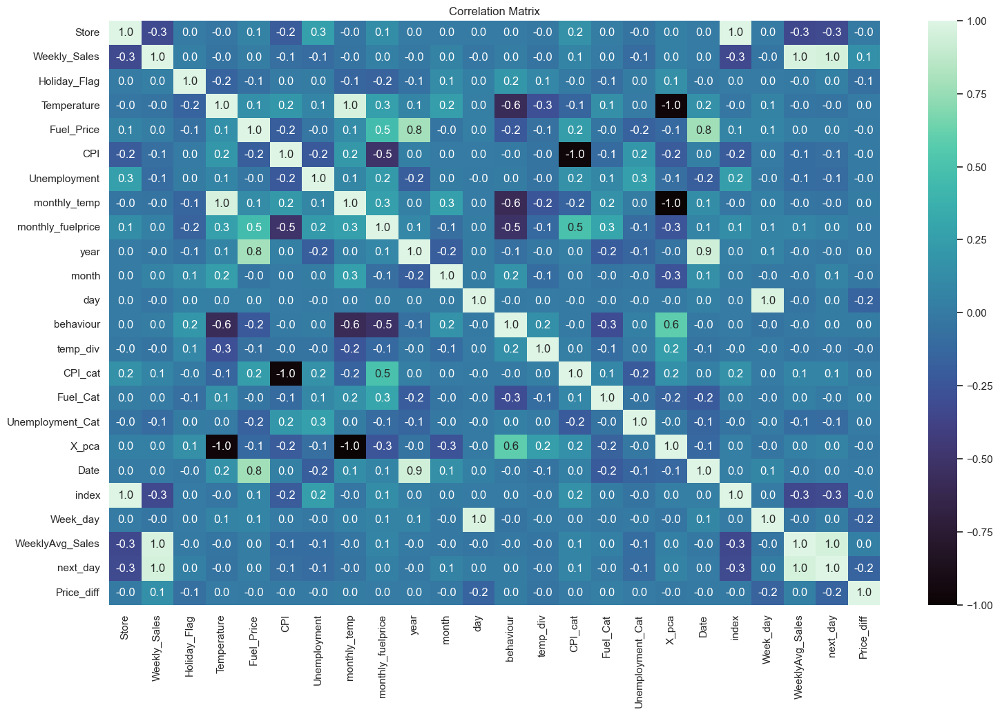

In [277]:
#Let's look at correlations
plt.figure(figsize=(18,11))
corr=df3.corr()
sns.heatmap(corr,cmap='mako',vmin=-1.0,vmax=1.0, annot=True , fmt=".1f")
plt.title('Correlation Matrix')
plt.show()

### Modelling

In [278]:
X = df.drop(
    columns=['Weekly_Sales' , 'Date','next_day','WeeklyAvg_Sales','index'])  # Features
y = df['Weekly_Sales']  # Target variable

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply Linear Regression
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Calculate mean squared error
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print("Mean Squared Error:", mse,"\nRMSE:" ,rmse)
print('R Squared:',r2_score(y_test,y_pred))

Mean Squared Error: 180467866420.1321 
RMSE: 424815.09674225573
R Squared: 0.402496945015658


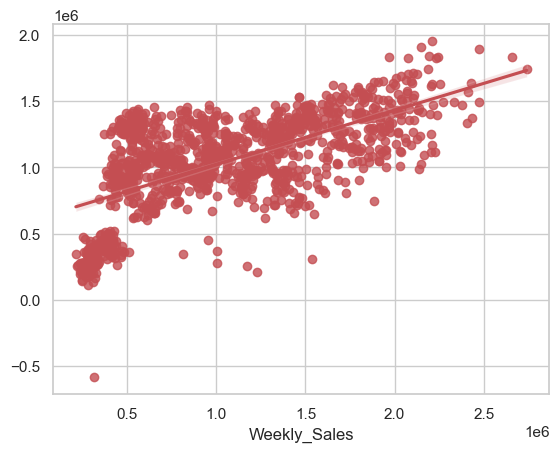

In [279]:
scat_plot=sns.regplot(x=y_test,y= y_pred,color='r')

In [280]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest Regression model
n_estimators = 100  # Number of trees in the forest
random_forest_model = RandomForestRegressor(n_estimators=n_estimators, random_state=42)

# Train the Random Forest Regression model
random_forest_model.fit(X_train, y_train)

# Make predictions on the test set
predictions = random_forest_model.predict(X_test)

# Calculate the mean squared error
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
print(i)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error: " , rmse)
print('R Squared:',r2_score(y_test,y_pred))

Price_diff
Mean Squared Error: 6769423808.813808
Root Mean Squared Error:  82276.50824393198
R Squared: 0.402496945015658


In [297]:
#Let's check up for train data
predictions = random_forest_model.predict(X_train)
print('R Squared:',r2_score(y_train, predictions))

R Squared: 0.9967288141594822


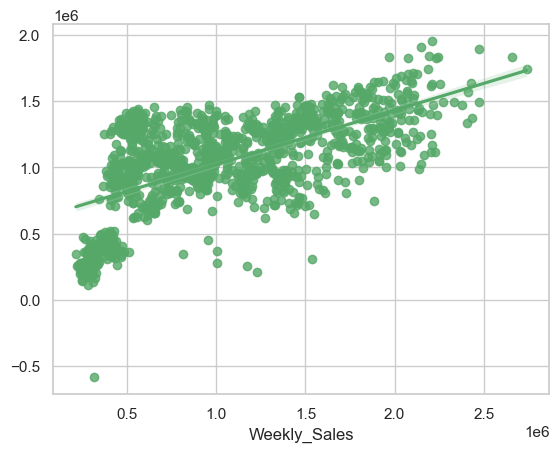

In [281]:
scat_plot=sns.regplot(x=y_test,y= y_pred,color='g')

### HyperTuning

In [300]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Initialize the Random Forest model
model = RandomForestRegressor()
# Define hyperparameter ranges
param_dist = {
    'n_estimators': np.arange(50, 200, 10),
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 11),
    'max_features': ['auto', 'sqrt', 'log2'],
    'bootstrap': [True, False]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=100, cv=5)
# Fit the RandomizedSearchCV on the training data
random_search.fit(X_train, y_train)
# Get the best parameters and best score
best_params = random_search.best_params_
best_score = random_search.best_score_

print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Parameters: {'n_estimators': 70, 'min_samples_split': 6, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': None, 'bootstrap': True}
Best Score: 0.9691684590471515


In [295]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Create a Ridge Regression model
alpha = 1.0  
ridge_model = Ridge(alpha=alpha)
# Train the Ridge Regression model
ridge_model.fit(X_train, y_train)
# Make predictions on the test set
predictions = ridge_model.predict(X_test)
# Calculate the mean squared error
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse) 
print(i)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error: " , rmse)
print('R Squared:',r2_score(y_test,y_pred))

Price_diff
Mean Squared Error: 180484020033.39304
Root Mean Squared Error:  424834.10883943044
R Squared: 0.4024969177522253


In [296]:
#Let's check up for train data
predictions = ridge_model.predict(X_train)
print('R Squared:',r2_score(y_train, predictions))

R Squared: 0.3999360758744539


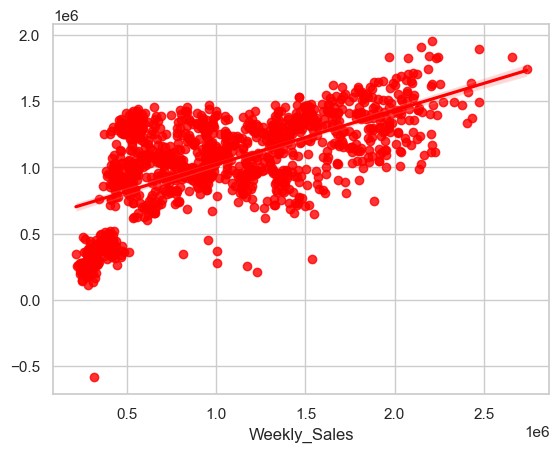

In [283]:
scat_plot=sns.regplot(x=y_test,y= y_pred,color='red')

In [292]:
X = df.drop(
    columns=['Weekly_Sales' , 'Date' , 'next_day','WeeklyAvg_Sales','index'])  # Features
y = df['Weekly_Sales']
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Apply Lasso Regression
lasso = Lasso(alpha=0.1) 
lasso.fit(X_train, y_train)
# Make predictions
y_pred = lasso.predict(X_test)
# Calculate mean squared error
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(i)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error: " , rmse)
print('R Squared:',r2_score(y_test,y_pred))

Price_diff
Mean Squared Error: 180467874654.69006
Root Mean Squared Error:  424815.1064341875
R Squared: 0.4024969177522253


In [294]:
#Let's check up for train data
predictions = lasso.predict(X_train)
print('R Squared:',r2_score(y_train, predictions))

R Squared: 0.39994459961272677


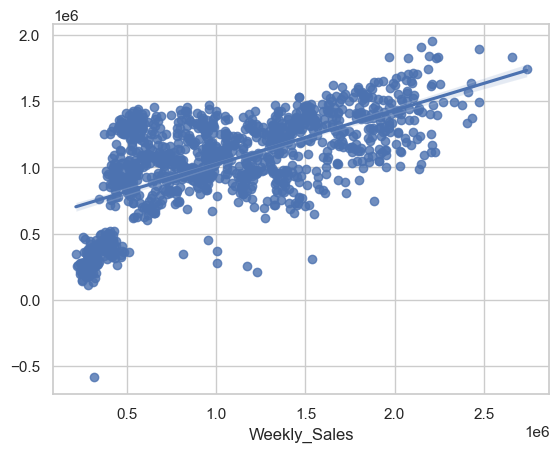

In [285]:
scat_plot=sns.regplot(x=y_test,y= y_pred,color='b')

In [286]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Create a DMatrix for training and testing
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)
# Define the parameters for the XGBoost regression model
params = {
    'objective': 'reg:squarederror',  
    'max_depth': 5,                   
    'learning_rate': 0.3               
}
# Train the XGBoost model
model = xgb.train(params, dtrain, num_boost_round=10)
# Make predictions on the test set
predictions = model.predict(dtest)
# Calculate the mean squared error
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
print(f"Mean Squared Error: {mse}")
print("Root Mean Squared Error: " , rmse)
print('R Squared:',r2_score(y_test, predictions))

Mean Squared Error: 32987853532.513287
Root Mean Squared Error:  181625.58611746662
R Squared: 0.8907819787863691


In [290]:
#Let's check up for train data 
predictions = model.predict(dtrain)
print('R Squared:',r2_score(y_train, predictions))

R Squared: 0.9017107791425633


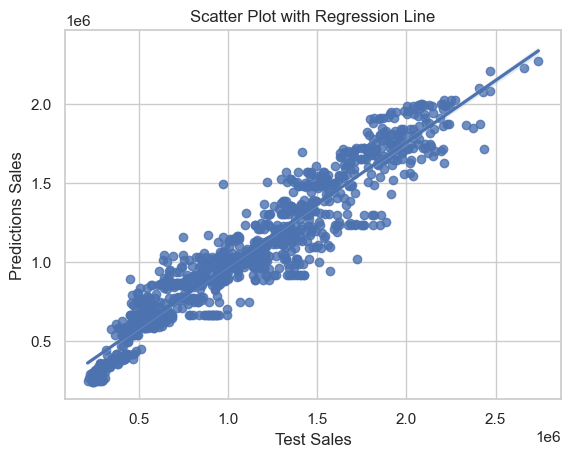

In [287]:
# Convert DMatrix to a NumPy array
dtest_array = dtest.get_label()
# Create the scatter plot
scat_plot = sns.regplot(x=dtest_array, y=predictions, color='b')
plt.xlabel('Test Sales')
plt.ylabel('Predictions Sales')
plt.title('Scatter Plot with Regression Line')

plt.show()

# The End